<a href="https://colab.research.google.com/github/bboszori/data_science_tasks/blob/main/10_homework_bboszori_timeseries_final_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Dataset

In [ ]:
!pip install prophet

In [ ]:
import pandas as pd
import numpy as np
import os
import random
import math
import warnings
warnings.filterwarnings('ignore')

import seaborn as sns
import matplotlib.pyplot as plt

import plotly
import plotly.express as px
import plotly.graph_objects as go

from pathlib import Path
from numpy import fft

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
import scipy.stats as st

from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import TimeSeriesSplit, cross_val_score
from sklearn.metrics import mean_absolute_error, make_scorer

from tqdm.notebook import tqdm_notebook

from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet import Prophet

plotly.offline.init_notebook_mode(connected=True)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Commonly used constants and paths
SEED = 42
DATA_PATH = '/content/gdrive/MyDrive/Data_Science_mentoring/09_advanced_regression'
DATA_FILE = f'{DATA_PATH}/hour.csv'
TARGET = 'cnt'
MULTITARGET = ['casual', 'registered']

In [ ]:
data = pd.read_csv(DATA_FILE)

## Task

### EDA (1 point)

In [ ]:
profile = ProfileReport(data, title="Profiling Report")

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

* Instant to index
* Season - Cyclical, sin-cos transform - [1-winter, 2-spring, 3-summer, 4 - fall]
* yr - to split data
* mnth - high correlation with season,  Cyclical, sin-cos transform
* hr - Cyclical, sin-cos transform; High correlation with cnt and registered
* holiday - categorical
* weekday - 0 - Sunday, 6- Saturday; Cyclical, sin-cos transform
* workingday - categorical
* weathersit - Ordinal, lower - more pleasent, higher - more extreme weather
* temp - num, already normalized, High correlation with casual
* atemp - num, already normalized, High correlation with casual
* hum - num, already normalized, negative correlation with casual
* windspeed - num, already normalized

 All 3 target is mostly correlated with hr, casual also seems to correlated to tempreture features.

In [ ]:
data['wd_test'] = pd.to_datetime(data['dteday']).dt.day_name()

In [ ]:
data[['weekday','wd_test']]

,weekday,wd_test
0,6,Saturday
1,6,Saturday
2,6,Saturday
3,6,Saturday
4,6,Saturday
...,...,...
17374,1,Monday
17375,1,Monday
17376,1,Monday
17377,1,Monday


In [ ]:
set(data[['season', 'mnth']].astype(str).agg('-'.join, axis=1))

{'1-1',
 '1-12',
 '1-2',
 '1-3',
 '2-3',
 '2-4',
 '2-5',
 '2-6',
 '3-6',
 '3-7',
 '3-8',
 '3-9',
 '4-10',
 '4-11',
 '4-12',
 '4-9'}

In [ ]:
data['temp_hum'] = data['temp'] * data['hum']

In [ ]:
num = ['temp', 'atemp', 'hum', 'windspeed', 'temp_hum']
cyclic = ['season', 'mnth', 'hr', 'weekday']
cat = ['holiday','workingday','weathersit']

In [ ]:
data.set_index('instant', inplace=True)

<Axes: xlabel='dteday'>

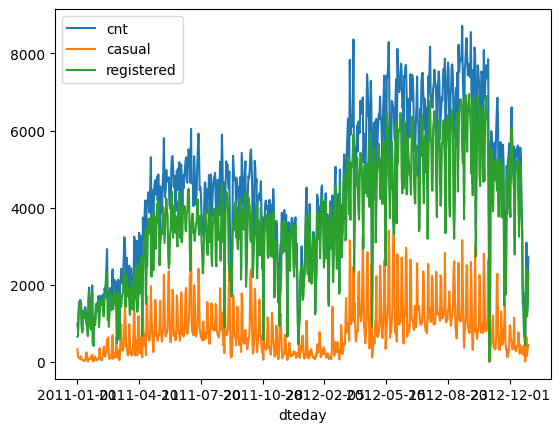

In [ ]:
data.groupby('dteday').agg({'cnt':'sum','casual':'sum', 'registered':'sum'}).reset_index().set_index('dteday').plot()

- In the second year we can see big jump in volume.
- In both year we can see a lower volume in winter and a higher demand in spring and summer - both casual and registered values move together

[Text(0.5, 1.0, 'Count of bikes during weekdays and weekends: Casual users')]

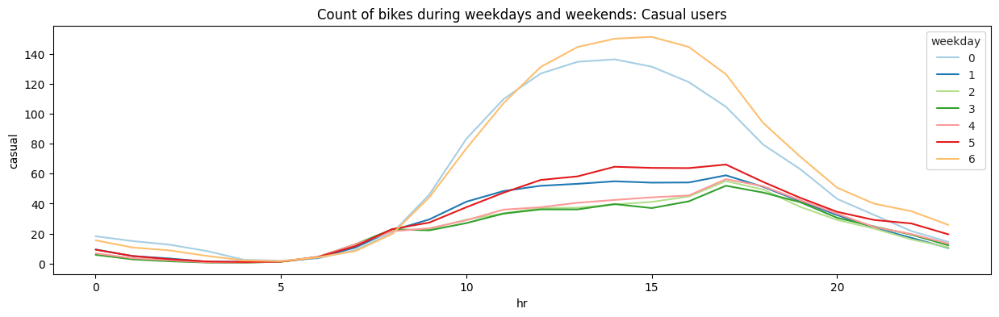

In [ ]:
fig, ax = plt.subplots(figsize=(15,4))
sns.set_style("whitegrid")
sns.lineplot(data=data, x='hr', y='casual', hue='weekday', ax=ax, palette=sns.color_palette("Paired"), ci=None)
ax.set(title='Count of bikes during weekdays and weekends: Casual users')

Casual users using the service mainly during the day and especially on the weekends.

[Text(0.5, 1.0, 'Count of bikes during weekdays and weekends: Registered users')]

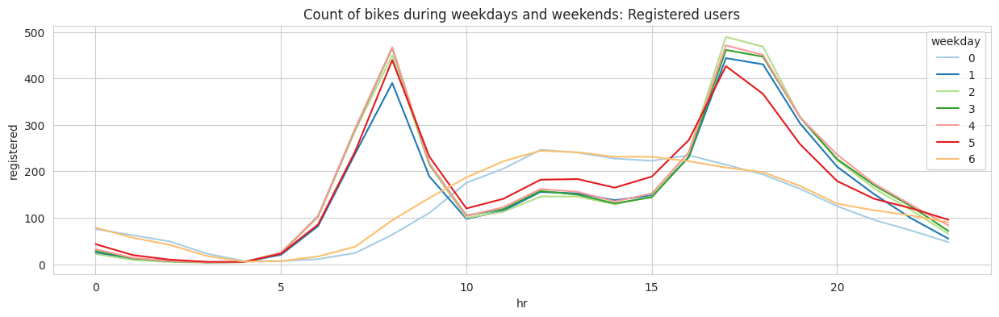

In [ ]:
fig, ax = plt.subplots(figsize=(15,4))
sns.set_style("whitegrid")
sns.lineplot(data=data, x='hr', y='registered', hue='weekday', ax=ax, palette=sns.color_palette("Paired"), ci=None)
ax.set(title='Count of bikes during weekdays and weekends: Registered users')

In the case of registered users, they mainly use the service right before and after woeking hours on the weekday. On the weekends registered users show a similar pattern as casual users, and using it mainly during daytime

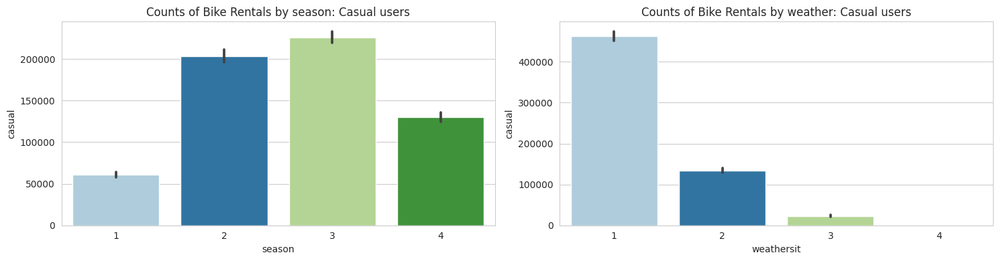

In [ ]:
f,  (ax1, ax2)  =  plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

ax1 = sns.barplot(data=data, x='season', y='casual', estimator='sum', palette=sns.color_palette("Paired"),ax=ax1).set(title="Counts of Bike Rentals by season: Casual users")
ax2 = sns.barplot(data=data, x='weathersit', y='casual', estimator='sum', palette=sns.color_palette("Paired"),ax=ax2).set(title="Counts of Bike Rentals by weather: Casual users")

f.tight_layout()

Casual users ride the bike mainly in spring and summer.
And seemingly the weather also has a high impact on the numbers. More pleasent the weather more bikes are rented out

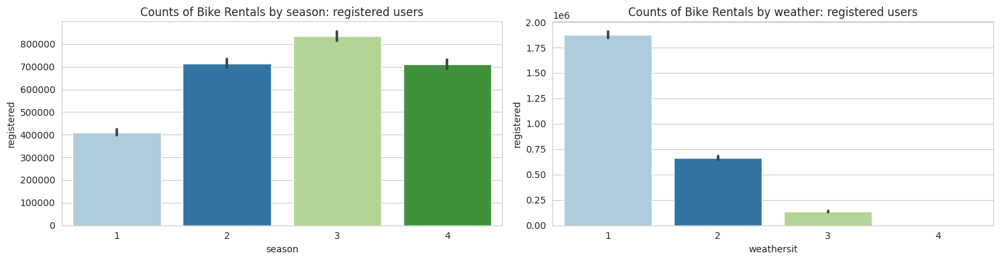

In [ ]:
f,  (ax1, ax2)  =  plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

ax1 = sns.barplot(data=data, x='season', y='registered', estimator='sum', palette=sns.color_palette("Paired"),ax=ax1).set(title="Counts of Bike Rentals by season: registered users")
ax2 = sns.barplot(data=data, x='weathersit', y='registered', estimator='sum', palette=sns.color_palette("Paired"),ax=ax2).set(title="Counts of Bike Rentals by weather: registered users")

f.tight_layout()

Registered users show same habits. Though, some registered customers tends to rent bike even during wintertime

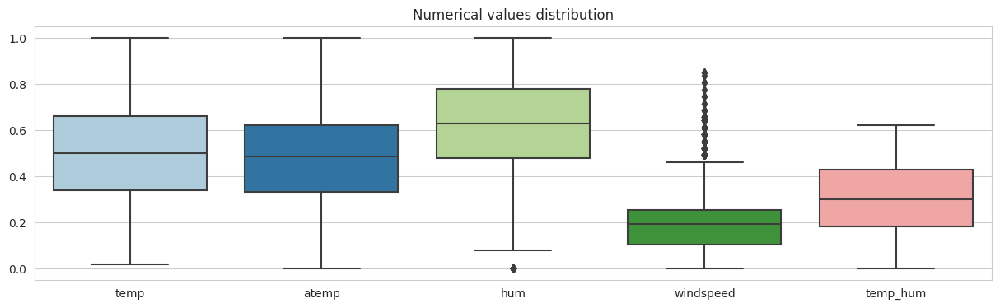

In [ ]:
fig,ax=plt.subplots(figsize=(15,4))
sns.boxplot(data=data[num], palette=sns.color_palette("Paired"))
ax.set_title('Numerical values distribution')
plt.show()

<Axes: >

Text(0.5, 1.0, 'Correlation matrix of attributes')

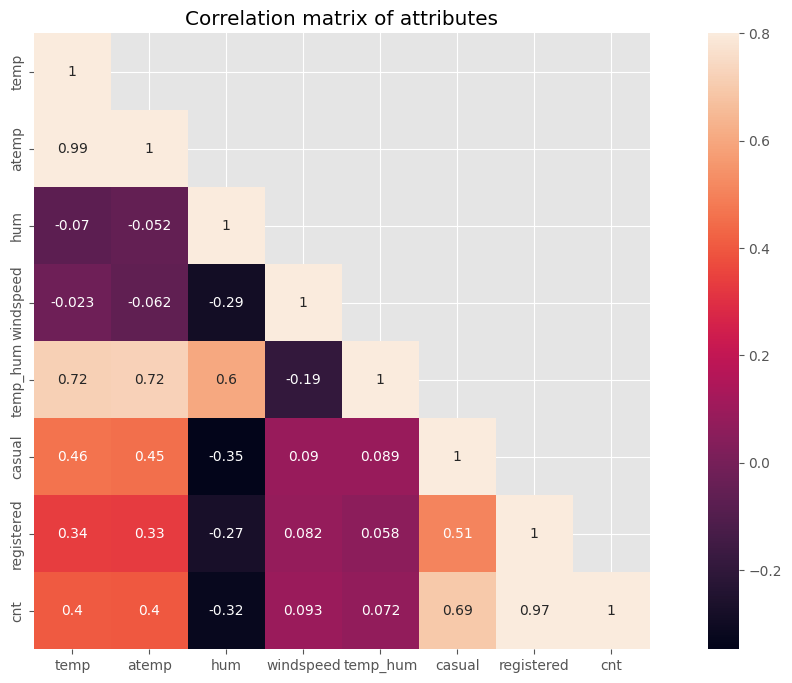

In [ ]:
correMtr=data[["temp","atemp","hum","windspeed", "temp_hum","casual","registered","cnt"]].corr()
mask=np.array(correMtr)
mask[np.tril_indices_from(mask)]=False

fig,ax=plt.subplots(figsize=(15,8))
sns.heatmap(correMtr,mask=mask,vmax=0.8,square=True,annot=True,ax=ax)
ax.set_title('Correlation matrix of attributes')
plt.show()

### Preprocessing

In [ ]:
data['dteday'] = pd.to_datetime(data['dteday'])
#data = data.set_index('dteday')
data['ts'] = data['dteday'] + pd.to_timedelta(data['hr'], unit='h')
data = data.set_index('ts')

In [ ]:
start_date = data.index.min()
end_date = data.index.max()
expected_timestamps = pd.date_range(start=start_date, end=end_date, freq='H')

In [ ]:
missing_timestamps = expected_timestamps[~expected_timestamps.isin(data.index)]

In [ ]:
len(expected_timestamps)

17544

In [ ]:
len(missing_timestamps)

165

In [ ]:
exo_features = ['temp', 'atemp', 'hum', 'windspeed', 'holiday', 'workingday', 'weathersit']

In [ ]:
data = data.reindex(expected_timestamps)
data['real_timestamp'] = ~data['cnt'].isna()
data.sort_index(inplace=True)
data[exo_features+[TARGET]] = data[exo_features+[TARGET]].interpolate(method='linear')
data.index.freq = 'H'

#### Test for stationarity

In [ ]:
from statsmodels.tsa.stattools import adfuller
y = data[TARGET]

alpha = 0.05
print(f"alpha = {alpha}\n")

# ADF Test
print("==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): ")
result = adfuller(y, autolag='AIC')
print(f'ADF Statistic: {result[0]:.4g}')
print(f'p-value: {result[1]:.4g}')
if result[1] < alpha:
    print("The process is stationary.")
else:
    print("The process is non-stationary.")

alpha = 0.05

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): 
ADF Statistic: -6.944
p-value: 1.008e-09
The process is stationary.


#### Time Series Decomposition

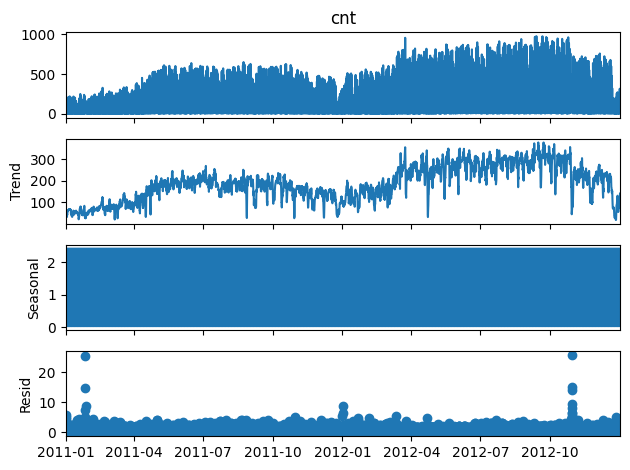

In [ ]:
decomposition = seasonal_decompose(data[TARGET], model='multiplicative', extrapolate_trend='freq')
fig = decomposition.plot()
plt.show()

In [ ]:
decomposition = seasonal_decompose(data[TARGET], model='additive', period=365)

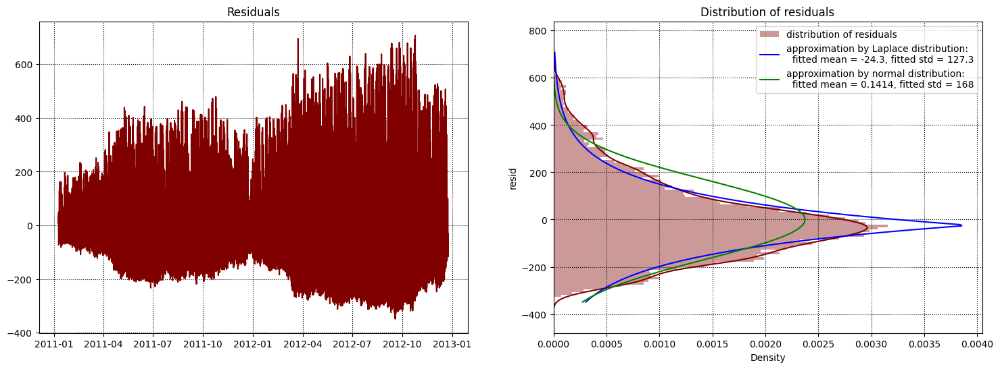

In [ ]:
resid = decomposition.resid
color = 'maroon'

plt.subplots(1, 2, figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.plot(resid, '-', color=color)
plt.grid(linestyle=':', color='k')
plt.title("Residuals")



x_fit = np.linspace(resid.min(), resid.max(), 201)
loc_laplace, scale_laplace = st.laplace.fit(resid.dropna())
loc_norm, scale_norm = st.norm.fit(resid.dropna())
# print(f"Fitting of residuals by Laplace distribution: fitted mean = {loc:.3f}, fitted std = {scale:.3f}")
y_fit_laplace = st.laplace.pdf(x_fit, loc_laplace, scale_laplace)
y_fit_norm = st.norm.pdf(x_fit, loc_norm, scale_norm)

plt.subplot(1, 2, 2)
sns.distplot(resid, color=color, bins=100, vertical=True, label="distribution of residuals")
plt.plot(y_fit_laplace, x_fit, '-b',
         label=f"approximation by Laplace distribution:\n  fitted mean = {loc_laplace:.4g}, fitted std = {scale_laplace:.4g}")
plt.plot(y_fit_norm, x_fit, '-g',
         label=f"approximation by normal distribution:\n  fitted mean = {loc_norm:.4g}, fitted std = {scale_norm:.4g}")
plt.legend()
# plt.ylim(resid-0.02*y_range, y_max+0.02*y_range)
plt.title("Distribution of residuals")
plt.grid(linestyle=':', color='k')

plt.show()

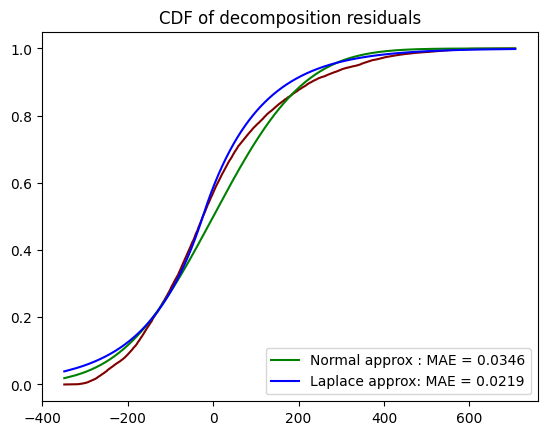

MAE_Gaussian/MAE_Laplace = 1.58.


In [ ]:
from statsmodels.distributions.empirical_distribution import ECDF
ecdf_resid_instance = ECDF(resid.dropna())
resid_arr = resid.dropna().sort_values().values
ecdf_resid = ecdf_resid_instance(resid_arr)


cdf_norm = st.norm.cdf(resid_arr, loc=loc_norm, scale=scale_norm)
cdf_laplace = st.laplace.cdf(resid_arr, loc=loc_laplace, scale=scale_laplace)


mae_norm = mean_absolute_error(ecdf_resid, cdf_norm)
mae_laplace = mean_absolute_error(ecdf_resid, cdf_laplace)


plt.plot(resid_arr, ecdf_resid, '-', color='maroon')
plt.plot(resid_arr, cdf_norm, '-g',
         label=f"Normal approx : MAE = {mae_norm:.3g}")
plt.plot(resid_arr, cdf_laplace, '-b',
         label=f"Laplace approx: MAE = {mae_laplace:.3g}")
plt.legend()
plt.title("CDF of decomposition residuals")
plt.show()

print(f"MAE_Gaussian/MAE_Laplace = {mae_norm/mae_laplace:.3g}.")

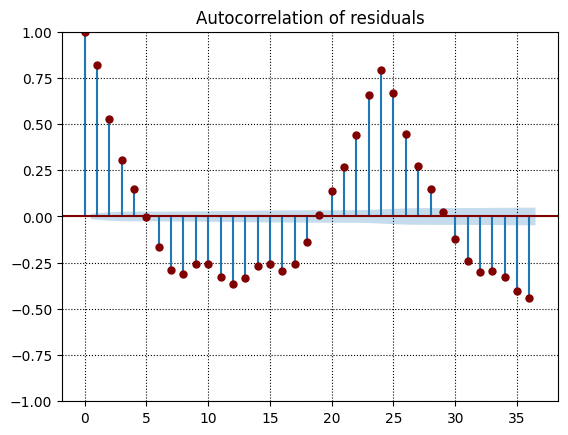

In [ ]:
lags = 36

plot_acf(resid.dropna(), lags=lags, color='maroon',
         title='Autocorrelation of residuals');
plt.grid(linestyle=':', color='k')
plt.show()

### Linear Regression with endogenous features

In [ ]:
endo_features = ['hr', 'weekday', 'mnth', 'yr']

In [ ]:
test_size = 30 * 24  # Number of hours in the last month
train_data = data[:-test_size]
test_data = data[-test_size:]

In [ ]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')
train_data_imputed = pd.DataFrame(imputer.fit_transform(train_data[endo_features]), columns=endo_features)
test_data_imputed = pd.DataFrame(imputer.fit_transform(test_data[endo_features]), columns=endo_features)

In [ ]:
model = LinearRegression()
model.fit(train_data_imputed[endo_features], train_data[TARGET])
y_pred = model.predict(test_data_imputed[endo_features])
mae = mean_absolute_error(test_data[TARGET], y_pred)
print('MAE:', mae)

MAE: 178.2776822233936


#### Residuals

In [ ]:
import statsmodels.api as sm

def check_resid(residuals):
  # Plot residuals
  plt.figure(figsize=(12, 6))
  plt.plot(residuals)
  plt.title('Residuals')
  plt.xlabel('Time')
  plt.ylabel('Residual Value')
  plt.grid(True)
  plt.show()

  # Distribution of residuals
  sns.histplot(residuals, kde=True)
  plt.title('Distribution of Residuals')
  plt.xlabel('Residual Value')
  plt.ylabel('Frequency')
  plt.show()

  # ACF and PACF of residuals
  fig, axes = plt.subplots(1, 2, figsize=(12, 4))
  plot_acf(residuals, ax=axes[0])
  plot_pacf(residuals, ax=axes[1])
  plt.tight_layout()
  plt.show()

  ljung_box_result = sm.stats.diagnostic.acorr_ljungbox(residuals, lags=[10], return_df=True)

  # Print the results
  print(ljung_box_result)

  # Interpret the results
  if ljung_box_result['lb_pvalue'][10] > 0.05:
      print("The residuals are likely white noise (fail to reject null hypothesis)")
  else:
      print("The residuals are likely not white noise (reject null hypothesis)")

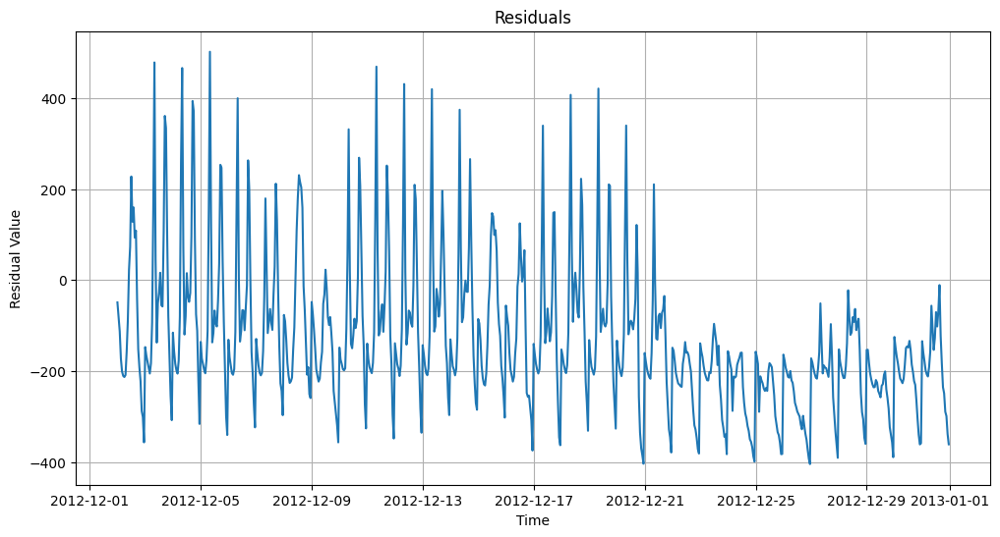

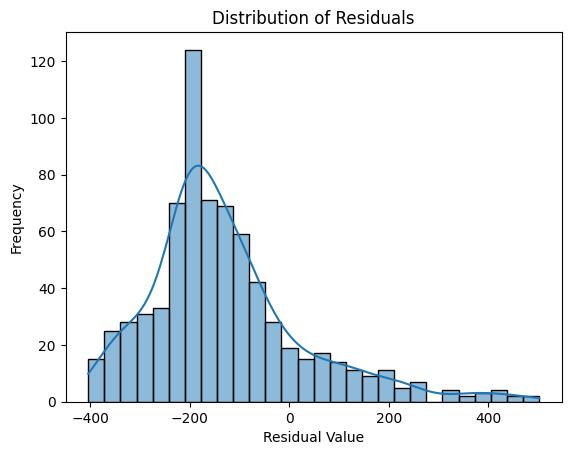

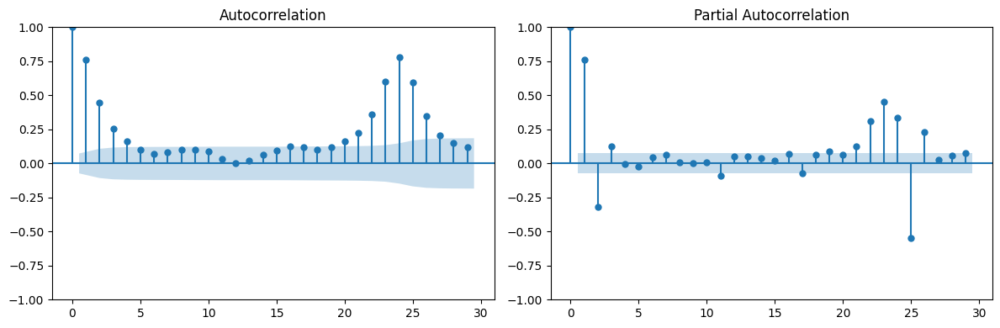

       lb_stat      lb_pvalue
10  663.015393  5.433203e-136
The residuals are likely not white noise (reject null hypothesis)


In [ ]:
residuals = test_data[TARGET] - y_pred

check_resid(residuals)

Residuals are not like white noise

### Linear Regression with endogenous polynomial features

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
polynom = PolynomialFeatures(3).fit(train_data_imputed[endo_features])
train_x_pol = pd.DataFrame(polynom.transform(train_data_imputed[endo_features]))
test_x_pol = pd.DataFrame(polynom.transform(test_data_imputed[endo_features]))

In [ ]:
model = LinearRegression()
model.fit(train_x_pol, train_data[TARGET])
y_pred = model.predict(test_x_pol)
mae = mean_absolute_error(test_data[TARGET], y_pred)
print('MAE:', mae)

MAE: 106.89786562693475


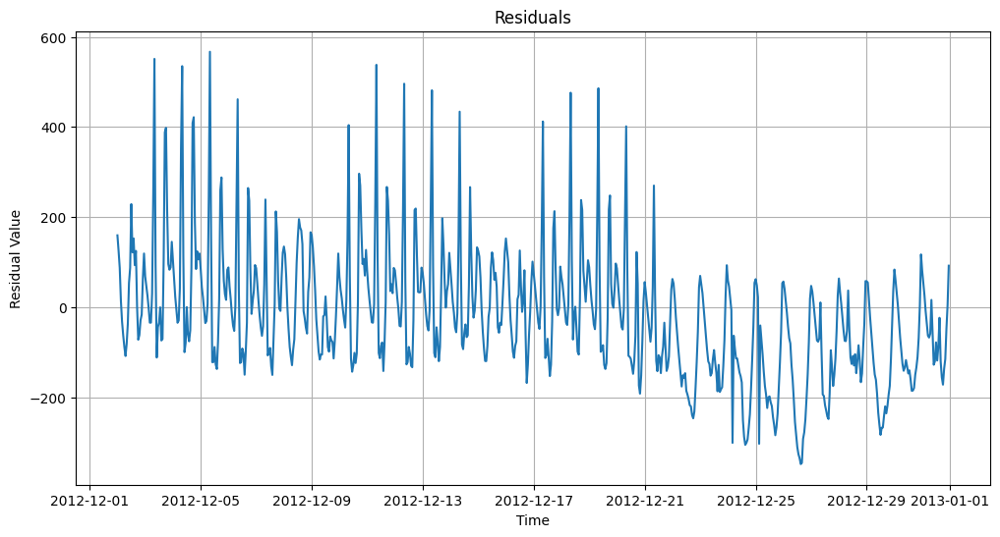

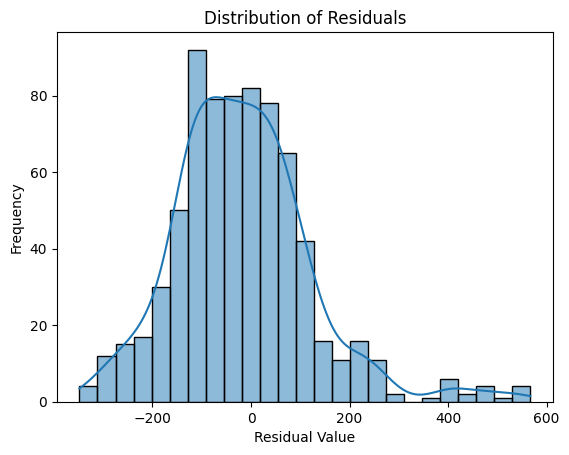

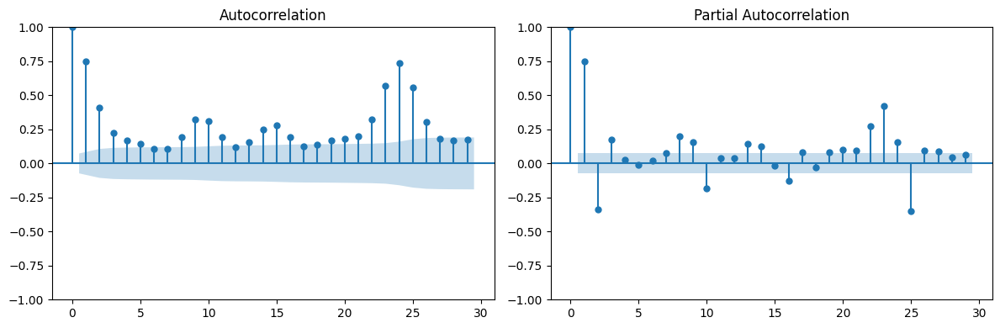

       lb_stat      lb_pvalue
10  783.598476  6.922152e-162
The residuals are likely not white noise (reject null hypothesis)


In [ ]:
residuals = test_data[TARGET] - y_pred

check_resid(residuals)

### Linear Regression with exogenous features

In [ ]:
exo_features = ['temp', 'atemp', 'hum', 'windspeed', 'holiday', 'workingday', 'weathersit']
features = endo_features + exo_features

In [ ]:
imputer = SimpleImputer(strategy='mean')
train_data[features] = imputer.fit_transform(train_data[features])
test_data[features] = imputer.transform(test_data[features])

In [ ]:
improved_model = LinearRegression()
improved_model.fit(train_data[features], train_data[TARGET])
y_pred_improved = improved_model.predict(test_data[features])

# Evaluate the improved model
mae_improved = mean_absolute_error(test_data[TARGET], y_pred_improved)
print('Improved MAE:', mae_improved)

Improved MAE: 119.00887843183854


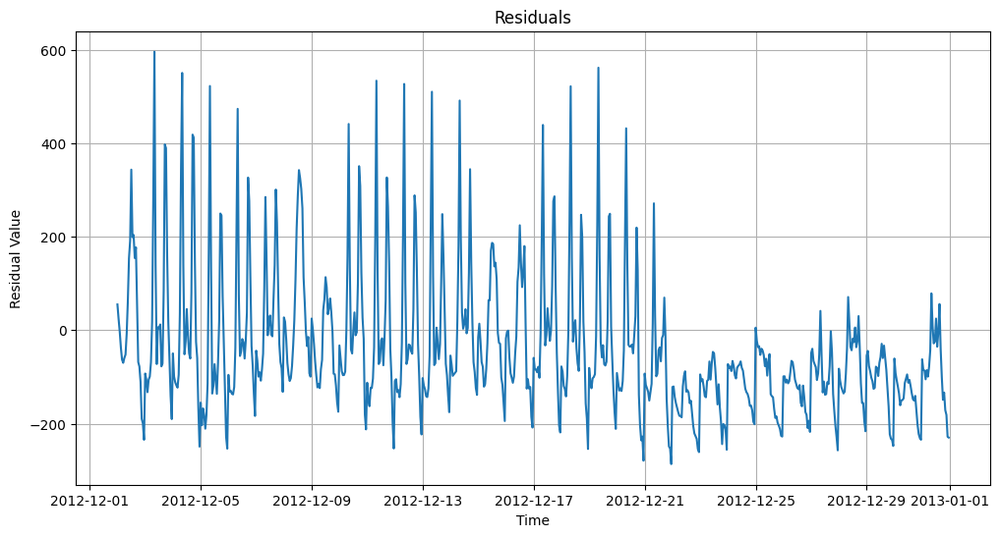

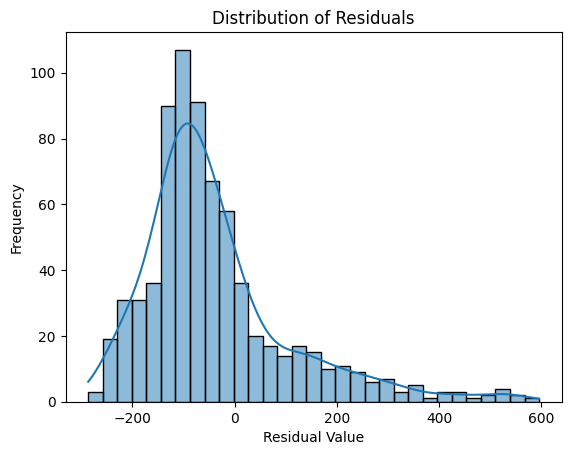

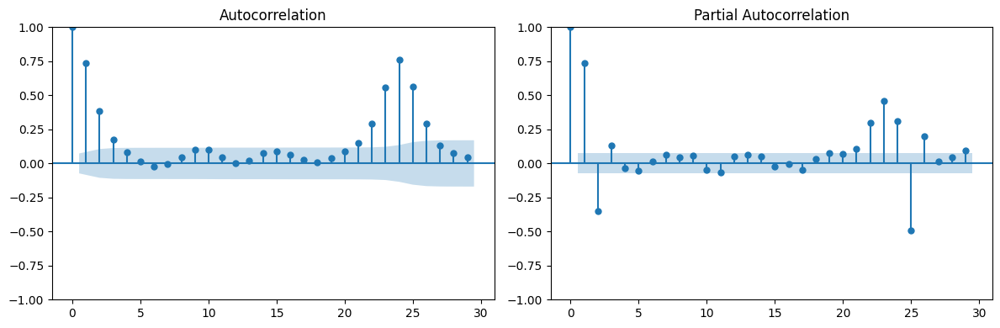

       lb_stat      lb_pvalue
10  545.999907  6.433572e-111
The residuals are likely not white noise (reject null hypothesis)


In [ ]:
residuals = test_data[TARGET] - y_pred_improved

check_resid(residuals)

### Linear Regression with exogenous polynomial features

In [ ]:
polynom = PolynomialFeatures(3).fit(train_data[features])
train_x_pol = pd.DataFrame(polynom.transform(train_data[features]))
test_x_pol = pd.DataFrame(polynom.transform(test_data[features]))

In [ ]:
improved_model = LinearRegression()
# Fit the model using all columns of the transformed DataFrame
improved_model.fit(train_x_pol, train_data[TARGET])
y_pred_improved = improved_model.predict(test_x_pol)

# Evaluate the improved model
mae_improved = mean_absolute_error(test_data[TARGET], y_pred_improved)
print('Improved MAE:', mae_improved)

Improved MAE: 94.82165387066003


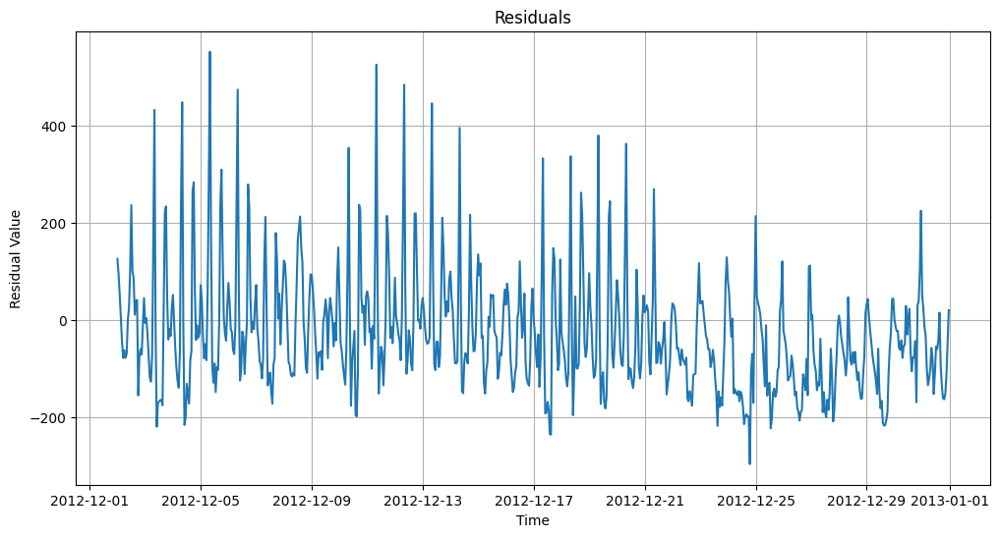

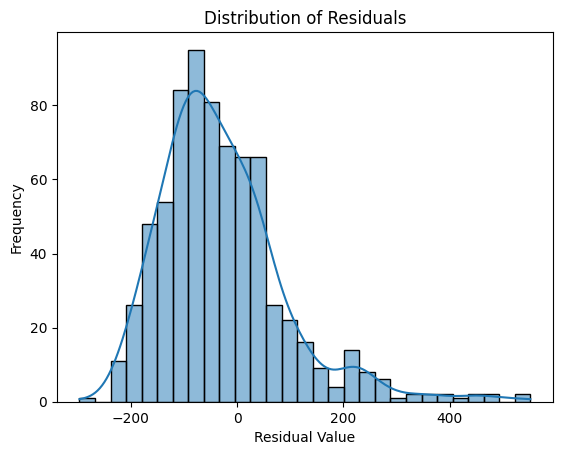

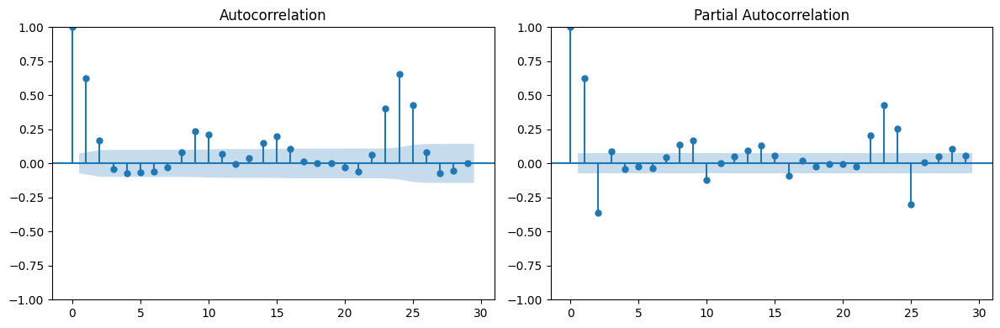

       lb_stat     lb_pvalue
10  391.963604  4.827759e-78
The residuals are likely not white noise (reject null hypothesis)


In [ ]:
residuals = test_data[TARGET] - y_pred_improved

check_resid(residuals)

### ARIMA

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
p, d, q = 5,1,0

model_arima = ARIMA(train_data[TARGET], order=(p, d, q))
model_arima_fit = model_arima.fit()

In [ ]:
# Make predictions on the test set
y_pred_arima = model_arima_fit.predict(test_data.index[0], test_data.index[-1])
mae_arima = mean_absolute_error(test_data[TARGET], y_pred_arima)
print('ARIMA MAE:', mae_arima)

ARIMA MAE: 125.19182781077048


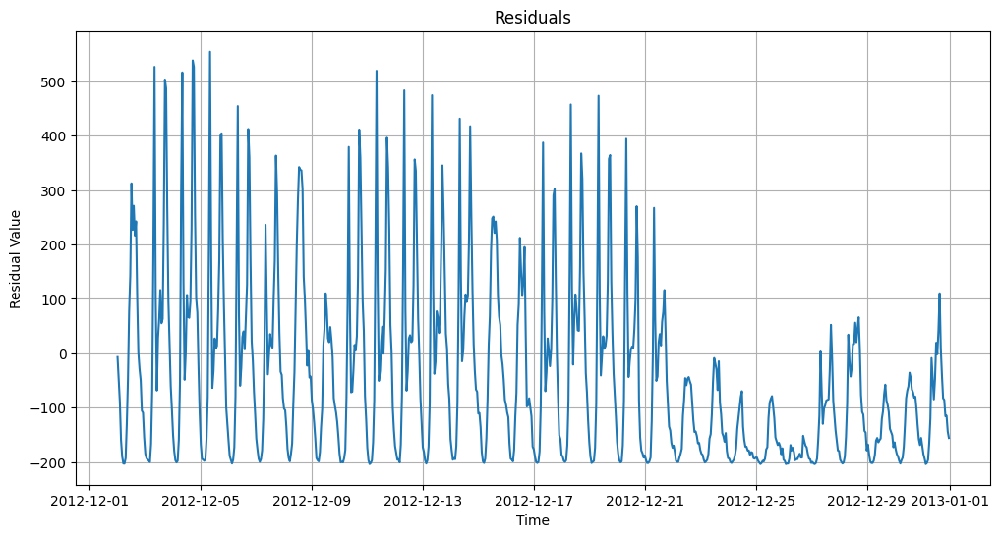

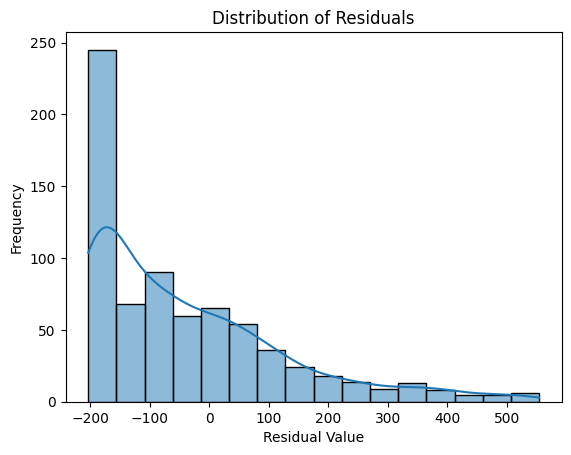

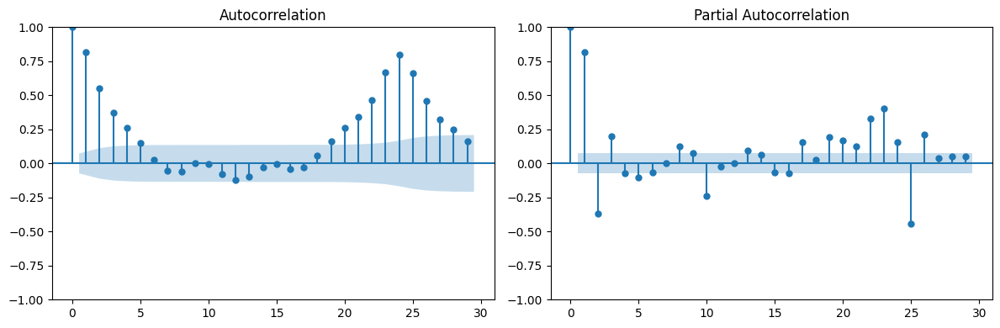

       lb_stat      lb_pvalue
10  877.167187  5.218355e-182
The residuals are likely not white noise (reject null hypothesis)


In [ ]:
residuals = test_data[TARGET] - y_pred_arima

check_resid(residuals)

In [ ]:
p_values = range(4, 7)
d_values = range(0, 2)
q_values = range(0, 3)

best_mae = float('inf')
best_p = None
best_d = None
best_q = None

for p in p_values:
    for d in d_values:
        for q in q_values:
            try:
                model_arima = ARIMA(train_data[TARGET], order=(p, d, q))
                model_arima_fit = model_arima.fit()
                y_pred_arima = model_arima_fit.predict(test_data.index[0], test_data.index[-1])
                mae_arima = mean_absolute_error(test_data[TARGET], y_pred_arima)

                if mae_arima < best_mae:
                    best_mae = mae_arima
                    best_p = p
                    best_d = d
                    best_q = q
            except:
                continue

print(f'Best ARIMA(p, d, q): ({best_p}, {best_d}, {best_q})')
print('Best ARIMA MAE:', best_mae)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Best ARIMA(p, d, q): (4, 1, 1)
Best ARIMA MAE: 124.85046086082392


### SARIMAX

In [ ]:
# SARIMAX model
p, d, q = 4, 1, 1
model_sarimax = SARIMAX(train_data[TARGET], order=(p, d, q), seasonal_order=(1, 1, 1, 24))
model_sarimax_fit = model_sarimax.fit()

y_pred_sarimax = model_sarimax_fit.predict(test_data.index[0], test_data.index[-1])

mae_sarimax = mean_absolute_error(test_data[TARGET], y_pred_sarimax)
print('SARIMAX MAE:', mae_sarimax)

SARIMAX MAE: 92.39478116121384


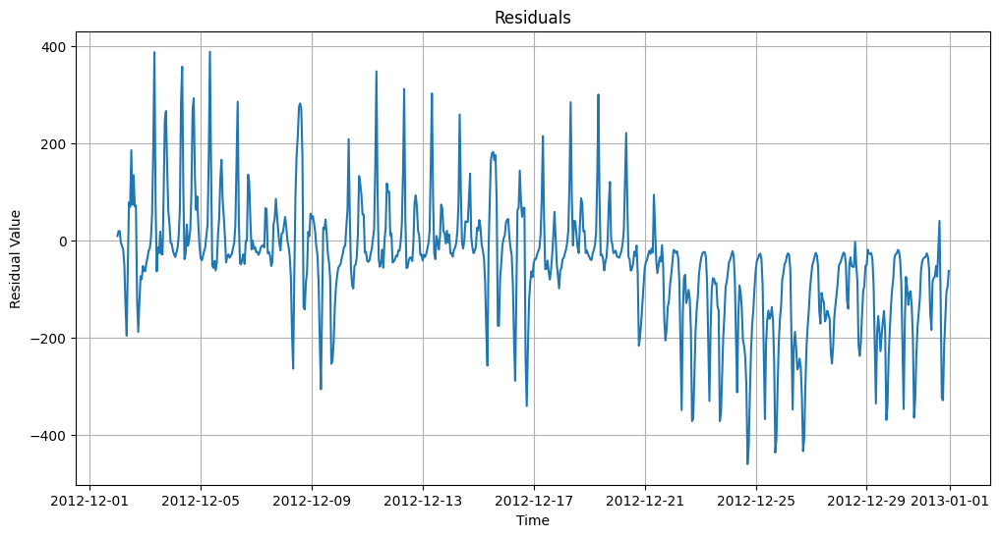

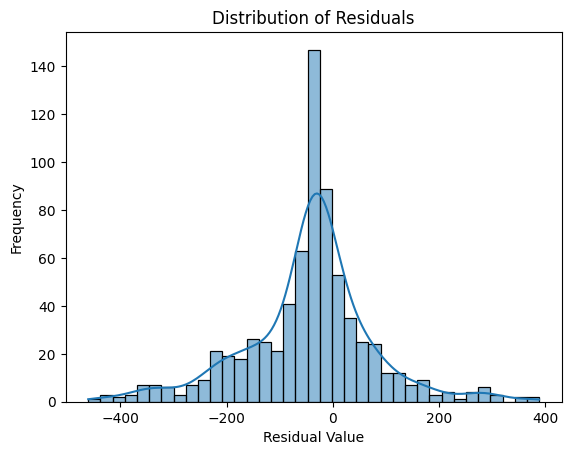

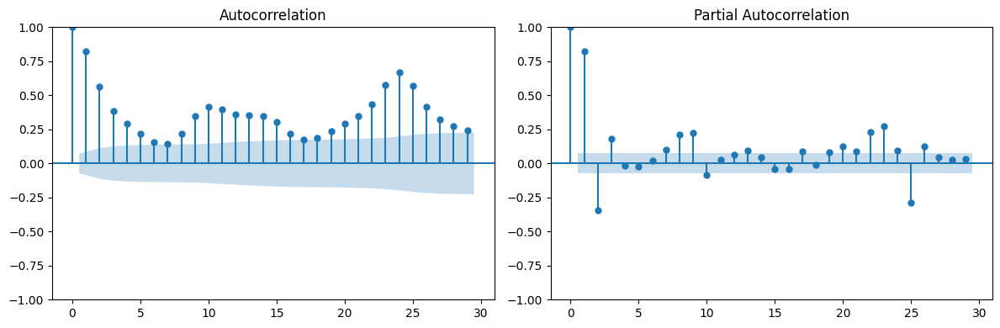

        lb_stat      lb_pvalue
10  1200.053913  1.402735e-251
The residuals are likely not white noise (reject null hypothesis)


In [ ]:
residuals = test_data[TARGET] - y_pred_sarimax

check_resid(residuals)

### Prophet

In [ ]:
# Prophet model
train_prophet = train_data.reset_index().rename(columns={'index': 'ds', 'cnt': 'y'}) # Replace 'your_target_column' with the actual name of your target column
test_prophet = test_data.reset_index().rename(columns={'index': 'ds', 'cnt': 'y'}) # Replace 'your_target_column' with the actual name of your target column

model_prophet = Prophet()
model_prophet.fit(train_prophet)

future = model_prophet.make_future_dataframe(periods=len(test_prophet), freq='H')
forecast = model_prophet.predict(future)

y_pred_prophet = forecast['yhat'][-len(test_prophet):].values

mae_prophet = mean_absolute_error(test_prophet['y'], y_pred_prophet)
print('Prophet MAE:', mae_prophet)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp8gyl7x1/8efiv4d4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp8gyl7x1/v7jx4wdm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53346', 'data', 'file=/tmp/tmpp8gyl7x1/8efiv4d4.json', 'init=/tmp/tmpp8gyl7x1/v7jx4wdm.json', 'output', 'file=/tmp/tmpp8gyl7x1/prophet_modelc6hjumgf/prophet_model-20240815194059.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:40:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:41:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Prophet MAE: 105.75996719523033


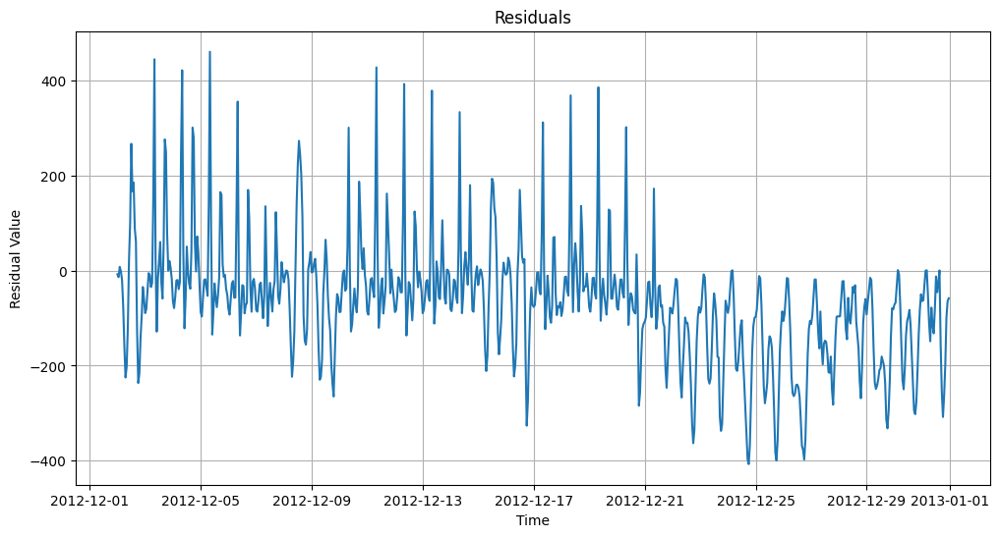

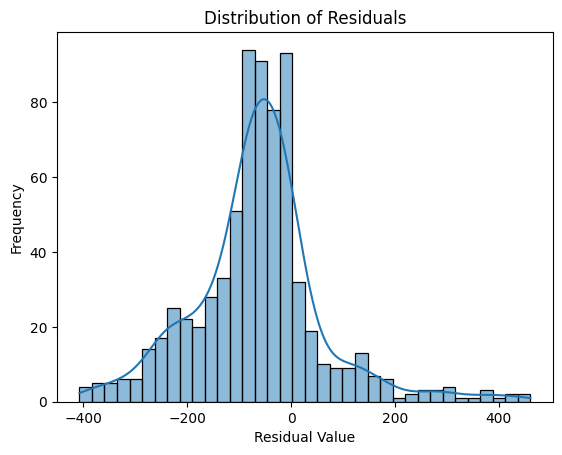

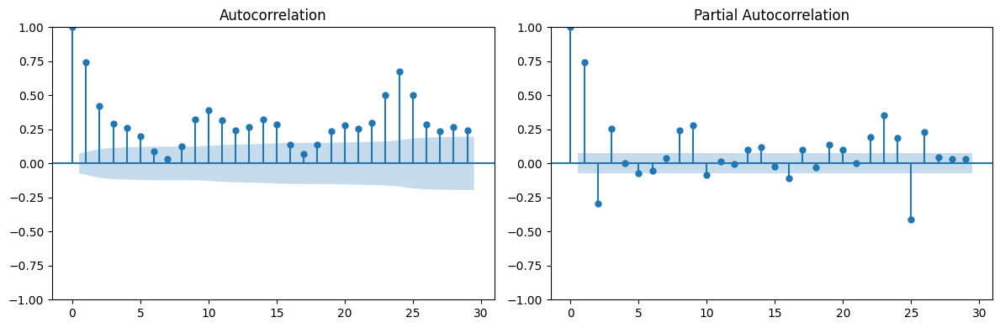

       lb_stat      lb_pvalue
10  875.117386  1.440746e-181
The residuals are likely not white noise (reject null hypothesis)


In [ ]:
residuals = test_data[TARGET] - y_pred_prophet

check_resid(residuals)

### Result

We got the best results with SARIMAX. MAE: 92.39478116121384